In [1]:
import numpy as np
import xgboost as xgb
import pandas as pd
from IPython.display import display #方便对数据进行可视化

该文件是对数据进行可视化的部分

In [2]:
# 导入训练数据
train_data = pd.read_csv(
    "train.csv", 
    low_memory=False)

store_features = pd.read_csv("store.csv")
# 导入测试数据
test_data = pd.read_csv("test.csv")

# 显示头5条记录

display(train_data.head(n=5))
display(store_features.head(n=5))
display(test_data.head(n=5))

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


,Id,Store,DayOfWeek,Date,Open,Promo,StateHoliday,SchoolHoliday
0,1,1,4,2015-09-17,1.0,1,0,0
1,2,3,4,2015-09-17,1.0,1,0,0
2,3,7,4,2015-09-17,1.0,1,0,0
3,4,8,4,2015-09-17,1.0,1,0,0
4,5,9,4,2015-09-17,1.0,1,0,0


首先对train_data进行可视化，其特征域中，‘Sales'和‘Customers'都可以绘制直方图

In [3]:
train_data.hist(column = 'Sales')
train_data.hist(column = 'Customers')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11f350588>]],
      dtype=object)

然后对store_feature进行可视化，其特征域中，以下几个可以作直方图.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11fa00898>]],
      dtype=object)

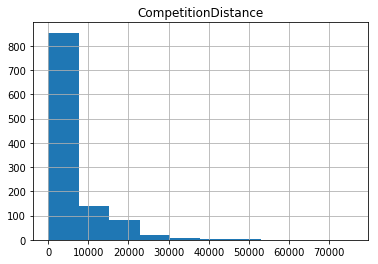

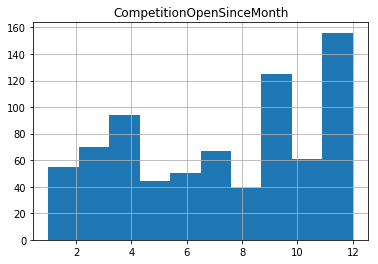

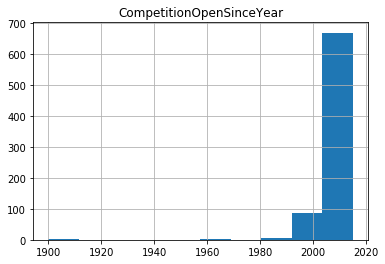

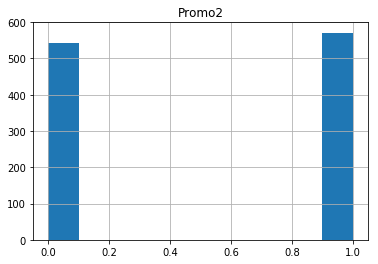

In [4]:
store_features.hist(column = 'CompetitionDistance')
store_features.hist(column = 'CompetitionOpenSinceMonth')
store_features.hist(column = 'CompetitionOpenSinceYear')
store_features.hist(column = 'Promo2')

In [5]:
display(store_features.head(n = 5))

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [6]:
category = ['StoreType', 'Assortment', 'PromoInterval']
store_features = pd.get_dummies(store_features, columns = category)
store_features.fillna(0, inplace = True)
display(store_features.head(n = 5))

,Store,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,StoreType_a,StoreType_b,StoreType_c,StoreType_d,Assortment_a,Assortment_b,Assortment_c,"PromoInterval_Feb,May,Aug,Nov","PromoInterval_Jan,Apr,Jul,Oct","PromoInterval_Mar,Jun,Sept,Dec"
0,1,1270.0,9.0,2008.0,0,0.0,0.0,0,0,1,0,1,0,0,0,0,0
1,2,570.0,11.0,2007.0,1,13.0,2010.0,1,0,0,0,1,0,0,0,1,0
2,3,14130.0,12.0,2006.0,1,14.0,2011.0,1,0,0,0,1,0,0,0,1,0
3,4,620.0,9.0,2009.0,0,0.0,0.0,0,0,1,0,0,0,1,0,0,0
4,5,29910.0,4.0,2015.0,0,0.0,0.0,1,0,0,0,1,0,0,0,0,0


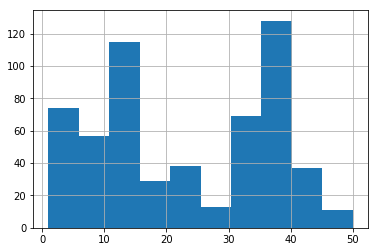

In [21]:
index_w = store_features['Promo2SinceWeek'] != 0
promo2week = store_features['Promo2SinceWeek'][index_w]
promo2week.hist()


In [8]:
display(store_features.head(n = 1))

,Store,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,StoreType_a,StoreType_b,StoreType_c,StoreType_d,Assortment_a,Assortment_b,Assortment_c,"PromoInterval_Feb,May,Aug,Nov","PromoInterval_Jan,Apr,Jul,Oct","PromoInterval_Mar,Jun,Sept,Dec"
0,1,1270.0,9.0,2008.0,0,0.0,0.0,0,0,1,0,1,0,0,0,0,0


array([<matplotlib.axes._subplots.AxesSubplot object at 0x11fbbbc18>],
      dtype=object)

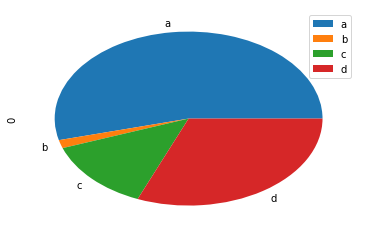

In [9]:
storetype_a = store_features['StoreType_a'].sum(axis = 0)
storetype_b = store_features['StoreType_b'].sum(axis = 0)
storetype_c = store_features['StoreType_c'].sum(axis = 0)
storetype_d = store_features['StoreType_d'].sum(axis = 0)
storetype = pd.DataFrame([storetype_a, storetype_b, storetype_c, storetype_d], index = ['a', 'b', 'c', 'd'])
storetype.plot.pie(subplots = True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x11fb6e780>],
      dtype=object)

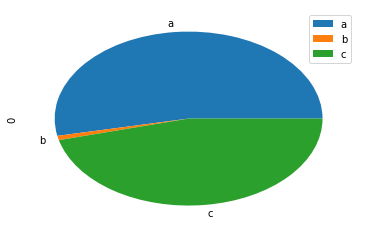

In [10]:
assortment_a = store_features['Assortment_a'].sum(axis = 0)
assortment_b = store_features['Assortment_b'].sum(axis = 0)
assortment_c = store_features['Assortment_c'].sum(axis = 0)
assortment = pd.DataFrame([assortment_a, assortment_b, assortment_c], index = ['a', 'b', 'c'])
assortment.plot.pie(subplots = True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x11fce9780>],
      dtype=object)

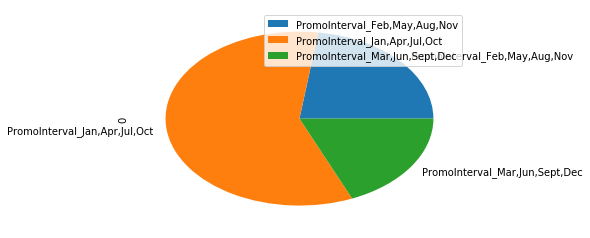

In [11]:
promointerval_f = store_features['PromoInterval_Feb,May,Aug,Nov'].sum(axis = 0)
promointerval_j = store_features['PromoInterval_Jan,Apr,Jul,Oct'].sum(axis = 0)
promointerval_m = store_features['PromoInterval_Mar,Jun,Sept,Dec'].sum(axis = 0)
promointerval = pd.DataFrame([promointerval_f, promointerval_j, promointerval_m], index = ['PromoInterval_Feb,May,Aug,Nov', 'PromoInterval_Jan,Apr,Jul,Oct', 'PromoInterval_Mar,Jun,Sept,Dec'])
promointerval.plot.pie(subplots = True)

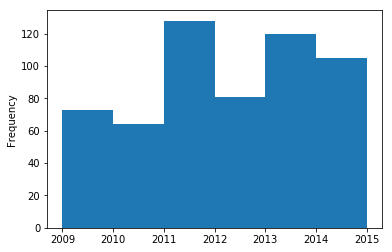

In [12]:
index = store_features['Promo2SinceYear']!=0

store_features['Promo2SinceYear'][index].plot.hist(bins = 6)

In [13]:
sales = train_data[['Store', 'Date', 'Sales']]
display(sales.head(n=5))

,Store,Date,Sales
0,1,2015-07-31,5263
1,2,2015-07-31,6064
2,3,2015-07-31,8314
3,4,2015-07-31,13995
4,5,2015-07-31,4822


In [14]:
sales['Date'] = pd.to_datetime(sales['Date'])
display(sales.head(n=5))
print(type(sales['Date'][0]))

/Users/liushengxi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,Store,Date,Sales
0,1,2015-07-31,5263
1,2,2015-07-31,6064
2,3,2015-07-31,8314
3,4,2015-07-31,13995
4,5,2015-07-31,4822


<class 'pandas._libs.tslib.Timestamp'>


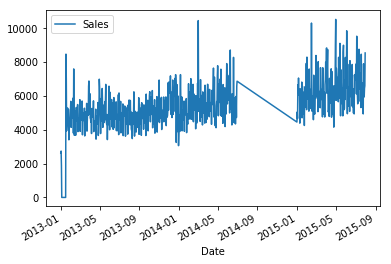

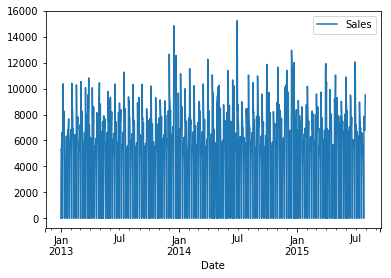

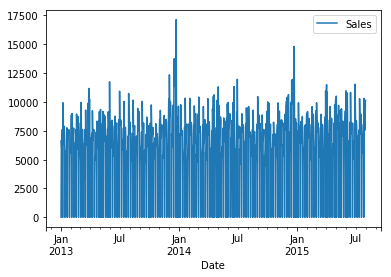

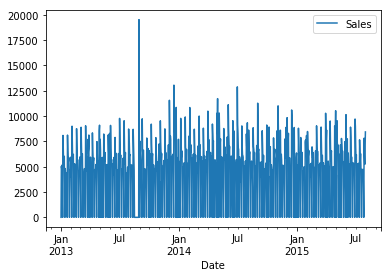

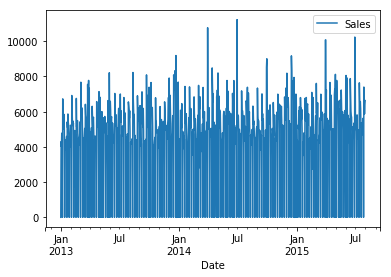

In [15]:
import random
#随机选取5家商店来观察销售额随时间的变化
for i in range(0, 5):
    store = random.randint(1, 1115)
    index = sales['Store'] == store
    v_sales = sales[['Date', 'Sales']][index]
    v_sales.plot(x = 'Date', y = 'Sales')


/Users/liushengxi/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


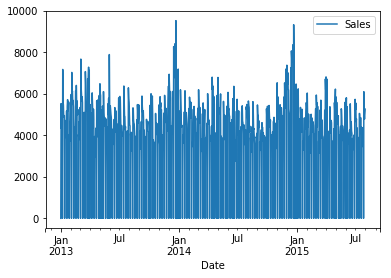

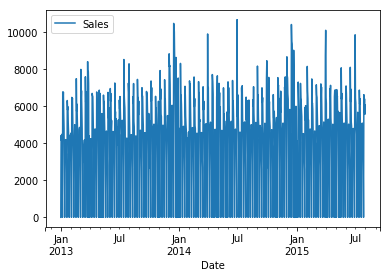

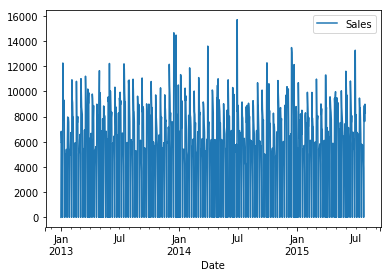

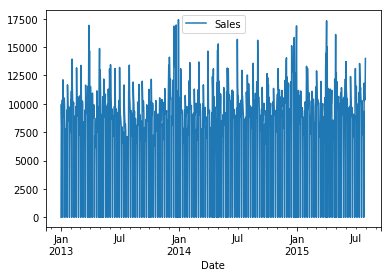

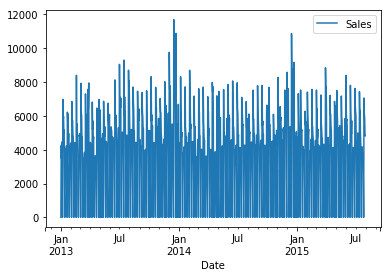

...

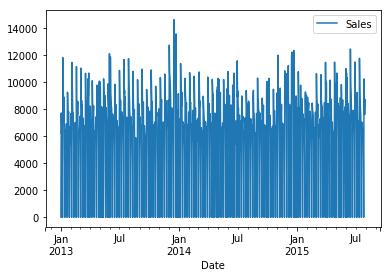

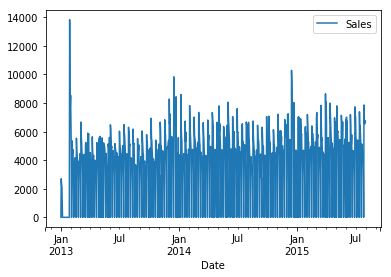

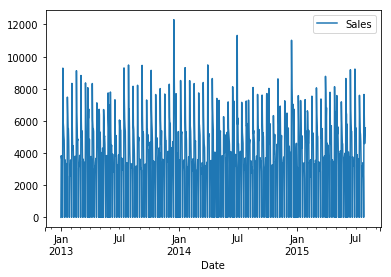

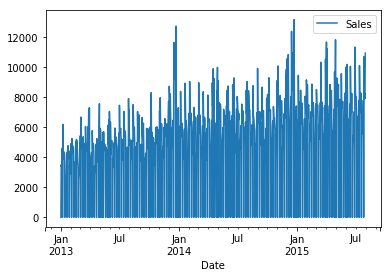

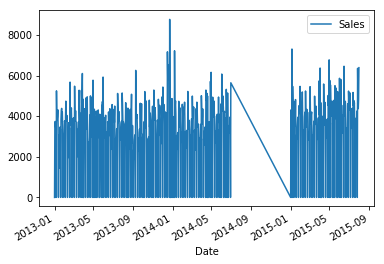

In [ ]:
for i in range(1, 1116):
    index_1 = sales['Store'] == i
    v_sales = sales[['Date', 'Sales']][index_1]
    v_sales.plot(x = 'Date', y = 'Sales', kind = 'line', sharex = True, sharey = True)
    

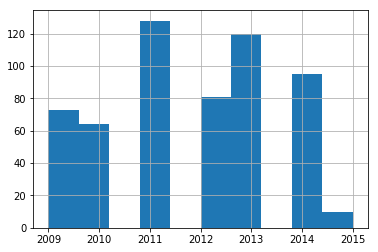

In [24]:
index_y = store_features['Promo2SinceYear'] != 0
promo2year = store_features['Promo2SinceYear'][index_y]
promo2year.hist()